# Aim

This notebook contains a bit of data exploration regarding the Fluorescent Neuronal Cells collection, with some summary statistics reported in the paper.

### Imports

Imports and settings.

In [1]:
import numpy as np
import pandas as pd
from pathlib import Path
from tqdm.auto import tqdm
from itertools import product

from IPython import get_ipython
from IPython.core.interactiveshell import InteractiveShell

from skimage import io
from matplotlib import pyplot as plt

# import warnings
# warnings.filterwarnings('ignore')


# Options for pandas
pd.options.display.max_columns = 50
pd.options.display.max_rows = 30
pd.options.display.float_format = '{:,.2f}'.format

# Display all cell outputs
InteractiveShell.ast_node_interactivity = 'all'

ipython = get_ipython()

# autoreload extension
if 'autoreload' not in ipython.extension_manager.loaded:
    %load_ext autoreload

%autoreload 2

# Visualizations
size = 14
params = {'legend.fontsize': 'large',
          'font.family': "Helvetica",
          'figure.figsize': (8, 8),
          'axes.labelsize': size,
          'axes.titlesize': size,
          'xtick.labelsize': 11,
          'ytick.labelsize': 9,
          'legend.title_fontsize': 11,
          'legend.fontsize': 9
          # 'axes.titlepad': 25
          }
plt.rcParams.update(params)

plt.style.use('seaborn-whitegrid')
# alternative to the above
# plt.rcParams["axes.grid"] = True
# plt.rcParams["axes.grid.which"] = "both"
# plt.rcParams["axes.linewidth"] = 0.5
# plt.rcParams["grid.linestyle"] = "--"
# plt.rcParams["grid.alpha"] = 0.5

/tmp/ipykernel_25553/3173276304.py:48: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


In [2]:
import sys

code_path = "../"
sys.path.append(code_path)
from fluocells.config import REPO_PATH, DATA_PATH, DATA_PATH_g, DATA_PATH_y, DATA_PATH_r, METADATA

# Visual Inspection

Let's first visualize some images and binary masks for each dataset.

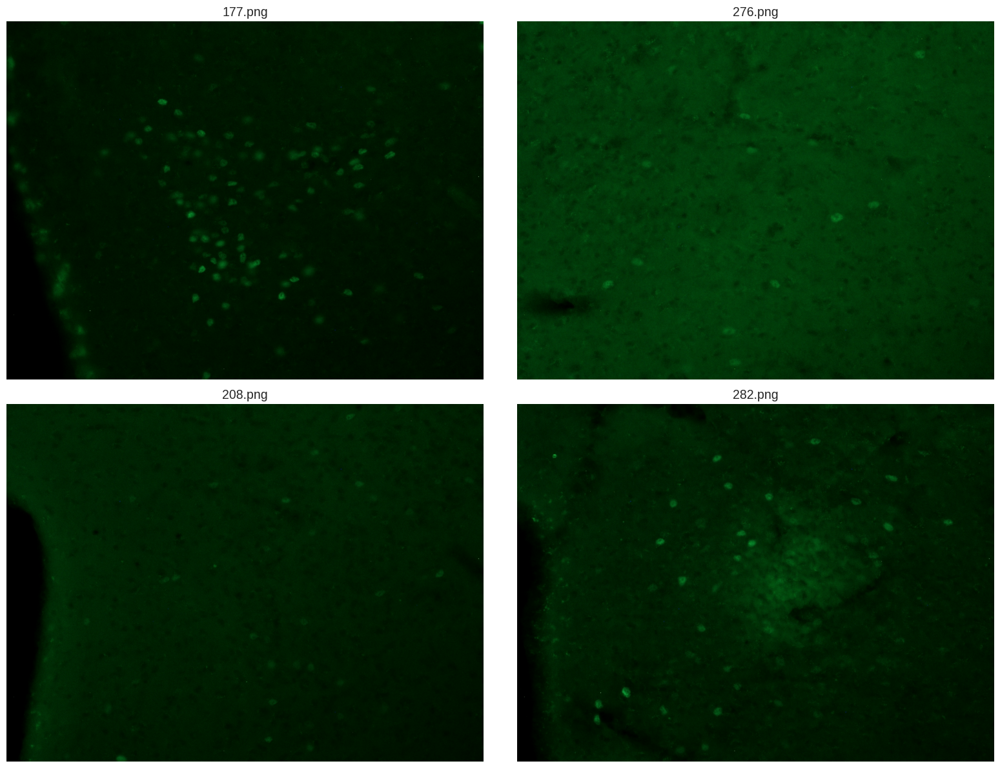

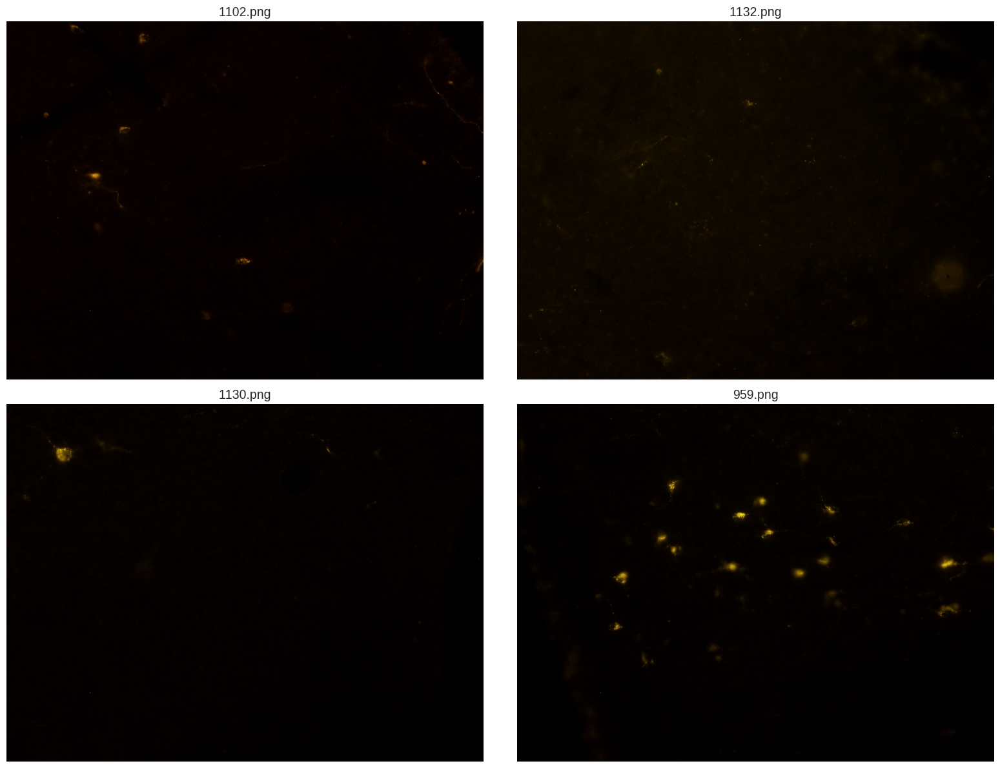

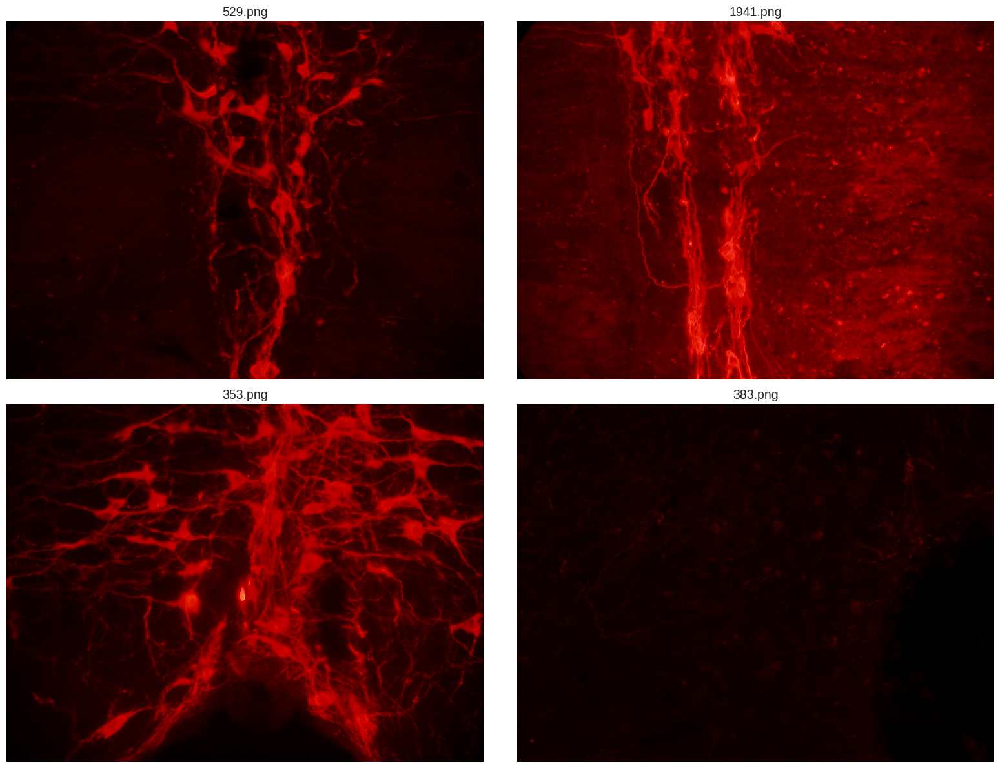

In [3]:
for dataset_path in [DATA_PATH_g, DATA_PATH_y, DATA_PATH_r]:
    sample_data_path = dataset_path / 'trainval' / 'images'
    fig = plt.figure(figsize=(16, 12))
    for i, img_path in enumerate([*sample_data_path.iterdir()][:4]):
        img = io.imread(img_path)
        sb = plt.subplot(2, 2, i + 1)
        plot = plt.title(img_path.name)
        plot = plt.axis('off')
        plot = plt.imshow(img)
    plt.tight_layout()
    plt.show()

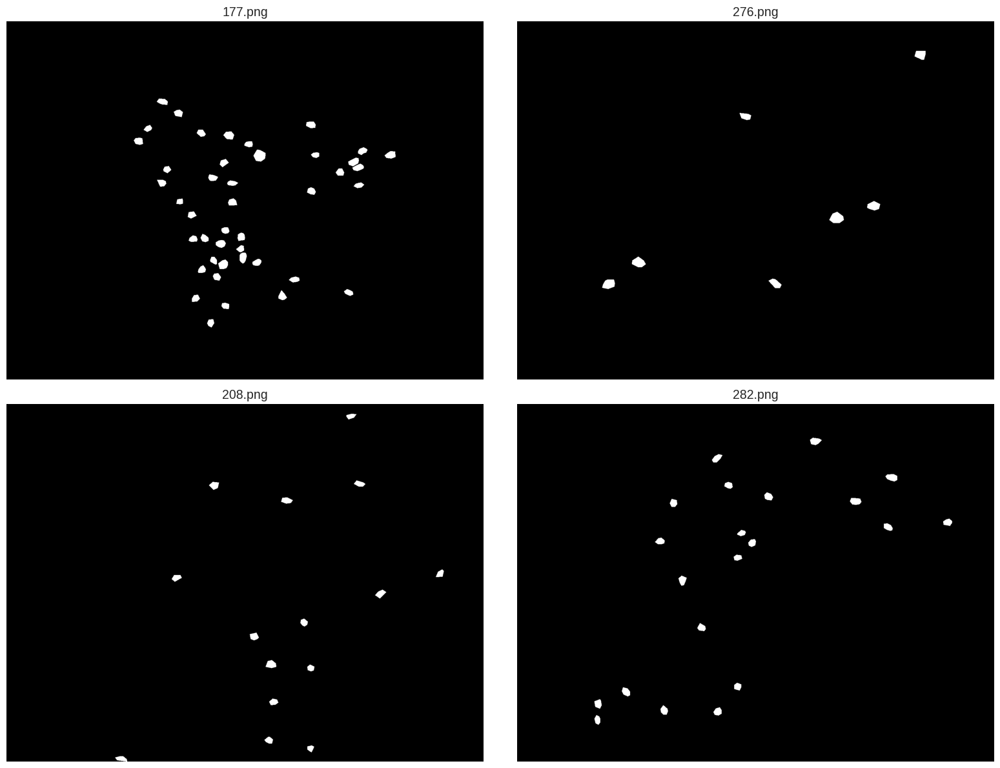

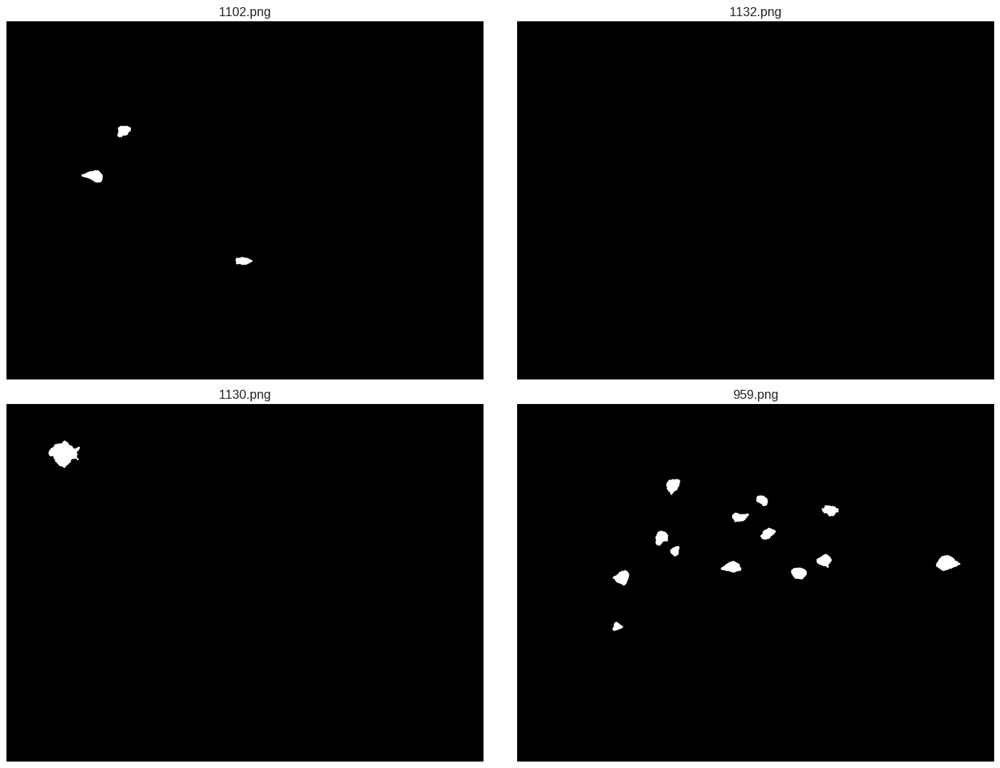

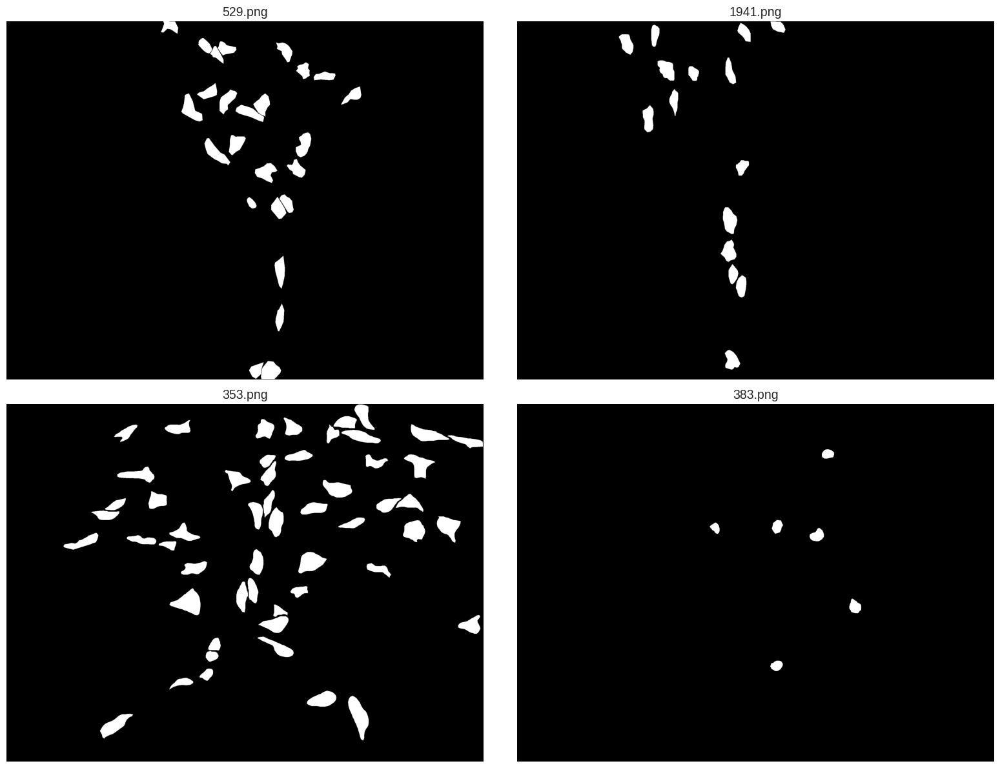

In [4]:
for dataset_path in [DATA_PATH_g, DATA_PATH_y, DATA_PATH_r]:
    sample_data_path = dataset_path / 'trainval' / 'ground_truths/masks'
    fig = plt.figure(figsize=(16, 12))
    for i, img_path in enumerate([*sample_data_path.iterdir()][:4]):
        img = io.imread(img_path, as_gray=True)
        sb = plt.subplot(2, 2, i + 1)
        plot = plt.title(img_path.name)
        plot = plt.axis('off')
        plot = plt.imshow(img, cmap="gray")
    plt.tight_layout()
    plt.show()

# Summary statistics

In [5]:
# read metadata
meta_df = pd.read_excel(DATA_PATH_y.parent /
                        f"metadata_{METADATA['current_version']}.xlsx",
                        sheet_name="metadata")

# Get summary stats and rearrange df for plotting
df_stats = meta_df.groupby(['dataset', 'partition'
                            ])['image_name'].size().reset_index(name='total')
df_stats

,dataset,partition,total
0,green,test,70
1,green,trainval,213
2,green,unlabelled,408
3,red,test,46
4,red,trainval,138
5,red,unlabelled,362
6,yellow,test,70
7,yellow,trainval,213
8,yellow,unlabelled,361


## Data volumes

In [6]:
total_images = len(meta_df)
total_labelled = len(meta_df.query("partition != 'unlabelled'"))
total_unlabelled = len(meta_df.query("partition == 'unlabelled'"))

print(f"{total_images=}")
print(f"{total_labelled=}")
print(f"{total_unlabelled=}")

total_images=1881
total_labelled=750
total_unlabelled=1131


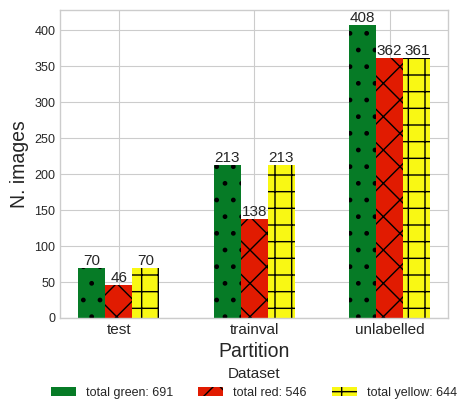

In [7]:
# labelling utils
datasets = ["green", "red", "yellow"]
sizes = df_stats.groupby("dataset")["total"].sum().values
colors = {"green": '#067b26', "red": '#e11b01', "yellow": '#f9f814'}
patterns = {"green": '.', "red": 'x', "yellow": '+'}
labels = [f"total {dataset}: {size}" for dataset, size in zip(datasets, sizes)]

# Plot
annotations_size = 11  #int(size*2/3)

width = 0.2
x = np.arange(len(df_stats['partition'].unique()))

fig, ax = plt.subplots(figsize=(5, 4))
colors = ['#067b26', '#e11b01', '#f9f814']
patterns = [".", "x", "+"]
h = 0
for i, (group, data) in enumerate(df_stats.groupby('dataset')):
    xs = x + (i - 1) * width
    _ = ax.bar(xs,
               data['total'],
               width=width,
               label=group,
               color=colors[i],
               hatch=patterns[i])
    for j, count in enumerate(data['total']):
        _ = ax.text(xs[j],
                    count,
                    str(count),
                    ha='center',
                    va='bottom',
                    size=annotations_size)

# Set custom x-axis tick labels
_ = ax.set_xticks(x)
_ = ax.set_xticklabels(df_stats['partition'].unique())

# Set labels and title
_ = ax.set_xlabel('Partition')
_ = ax.set_ylabel('N. images')
# _ = ax.set_title('FNC collection composition')
_ = ax.legend(title='Dataset')

# Set layout for consistent outlook
_ = fig.patch.set_alpha(0)
_ = ax.patch.set_alpha(0)

# Move the legend outside and set custom labels
_ = ax.legend(title='Dataset',
              bbox_to_anchor=(0.5, -0.3),
              loc='lower center',
              ncol=len(df_stats['dataset'].unique()),
              fancybox=True,
              shadow=True,
              labels=labels,
#               title_fontsize=annotations_size,
#               fontsize=annotations_size - 2
             )
# Save the plot as PDF
fig.savefig(REPO_PATH / "figures" / "FNC_composition.pdf", bbox_inches='tight')
plt.show()

## Dataset only statistics

This section refers to statistics only grouped by datset.

### Class imbalance

In [8]:
all_mask_paths = []
for dataset, partition in product(["green", "red", "yellow"],
                                  ["trainval", "test"]):
    all_mask_paths.extend(
        [*(DATA_PATH / dataset / partition / "ground_truths/masks").iterdir()])

signal_pct_df = pd.DataFrame()
for mask_path in tqdm(all_mask_paths):
    mask = io.imread(mask_path, as_gray=True)
    total_pixels = mask.shape[0] * mask.shape[1]

    partition = mask_path.parent.parent.parent.name
    dataset = mask_path.parent.parent.parent.parent.name

    # check binary masks
    if len(np.unique(mask)) > 2:
        print(mask_path.name)
        print(np.unique(mask))
        raise (NotImplementedError)

    # check masks are in [0, 255] format
    if mask.max() != 255 and 0:
        # mask = mask/mask.max()
        raise (NotImplementedError)

    ones = mask.astype('bool').sum()
    zeros = total_pixels - ones
    values, counts = [0, 1], [zeros, ones]

    image_signal_stats = pd.DataFrame(
        [[mask_path.name, dataset, partition, zeros, ones, total_pixels]],
        columns=[
            "image_name", "dataset", "partition", "zeros", "ones", "total"
        ])
    signal_pct_df = pd.concat([signal_pct_df, image_signal_stats], axis=0)

  0%|          | 0/750 [00:00<?, ?it/s]

In [9]:
eps = 1
qq = [0.1, 0.25, 0.5, 0.75, 0.9]

signal_pct_df[
    'class0_to_total'] = signal_pct_df["zeros"] / signal_pct_df["total"] * 100
signal_pct_df[
    'class1_to_total'] = signal_pct_df["ones"] / signal_pct_df["total"] * 100
# signal_pct_df['background_to_signal'] = signal_pct_df["zeros"]/(signal_pct_df["ones"]+eps)

signal_pct_df['zeros'] = signal_pct_df['zeros'].astype(int)
signal_pct_df['ones'] = signal_pct_df['ones'].astype(int)
signal_pct_df['total'] = signal_pct_df['total'].astype(int)
signal_pct_df['class0_to_total'] = signal_pct_df['class0_to_total'].astype(
    float)
signal_pct_df['class1_to_total'] = signal_pct_df['class1_to_total'].astype(
    float)

signal_pct_df.head()

,image_name,dataset,partition,zeros,ones,total,class0_to_total,class1_to_total
0,177.png,green,trainval,1896715,23285,1920000,98.79,1.21
0,276.png,green,trainval,1913240,6760,1920000,99.65,0.35
0,208.png,green,trainval,1912466,7534,1920000,99.61,0.39
0,282.png,green,trainval,1908468,11532,1920000,99.40,0.60
0,254.png,green,trainval,1901449,18551,1920000,99.03,0.97


In [10]:
def _create_multiindex_univariate(var):

    idx = pd.MultiIndex.from_tuples([
        ('variable', ''),
        (var, 'green'),
        (var, 'red'),
        (var, 'yellow'),
    ],
                                    names=['feature', 'dataset'])
    return idx


summary = signal_pct_df.groupby(["dataset"]).describe(percentiles=qq)

summary_table_univariate = summary.transpose().reset_index().set_index(
    'level_1')
summary_table_univariate = summary_table_univariate[
    summary_table_univariate.level_0 == "class1_to_total"]
summary_table_univariate.index.name = "statistics"
idx = _create_multiindex_univariate("signal %")
summary_table_univariate.columns = idx
summary_table_univariate.drop("variable", axis=1, inplace=True)
summary_table_univariate

/tmp/ipykernel_25553/2506354586.py:22: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  summary_table_univariate.drop("variable", axis=1, inplace=True)


feature    signal %              
dataset       green    red yellow
statistics                       
count        283.00 184.00 283.00
mean           0.64   2.61   0.59
std            0.57   1.74   0.72
min            0.00   0.00   0.00
10%            0.10   0.37   0.00
25%            0.25   1.34   0.10
50%            0.45   2.34   0.42
75%            0.92   3.53   0.80
90%            1.38   4.89   1.28
max            3.36   8.40   5.75

### Object features

In [11]:
%autoreload 2
from fluocells.utils.data import compute_masks_stats

cell_stats_df = compute_masks_stats(all_mask_paths)

  0%|          | 0/750 [00:00<?, ?it/s]

#### Check small objects


In [12]:
AREA_THRESHOLD = 100
objects_to_check = cell_stats_df[cell_stats_df.area < AREA_THRESHOLD]

print("Suspect objects:", len(objects_to_check))

objects_to_check

Suspect objects: 4


,image_name,dataset,partition,n_cells,cell_id,area,min_axis_length,max_axis_length,equivalent_diameter,feret_diameter_max
10583,1098.png,yellow,trainval,6.00,3.00,82.00,8.86,12.14,10.22,13.34
10656,934.png,yellow,test,2.00,0.00,64.00,6.84,12.88,9.03,13.15
10669,922.png,yellow,test,16.00,11.00,69.00,7.89,11.23,9.37,12.08
10755,914.png,yellow,test,2.00,1.00,69.00,7.72,11.53,9.37,12.08


1098.png
object area: 82


(-0.5, 1599.5, 1199.5, -0.5)

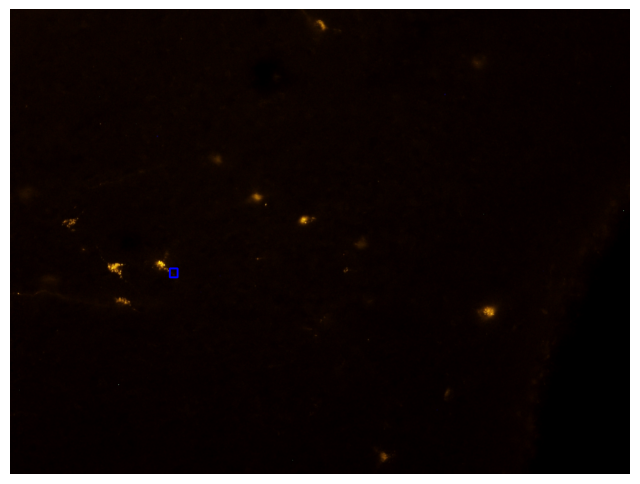

934.png
object area: 64


(-0.5, 1599.5, 1199.5, -0.5)

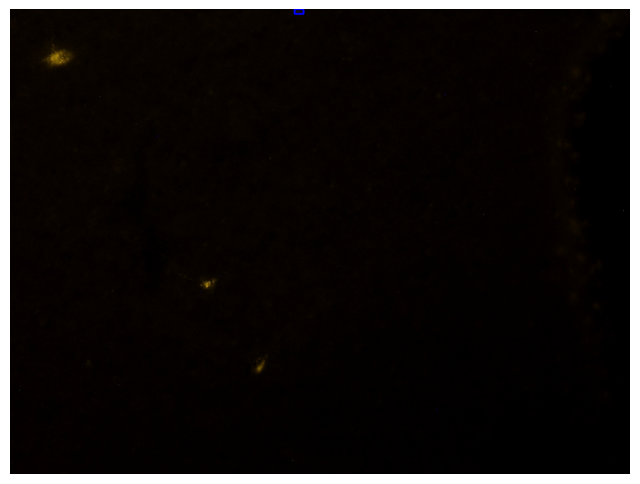

922.png
object area: 69


(-0.5, 1599.5, 1199.5, -0.5)

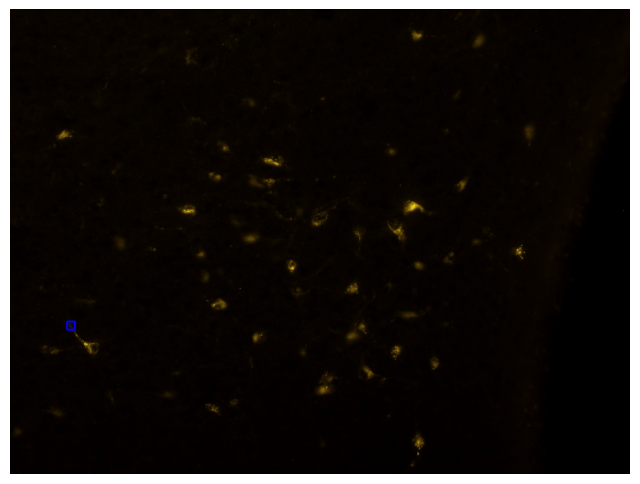

914.png
object area: 69


(-0.5, 1599.5, 1199.5, -0.5)

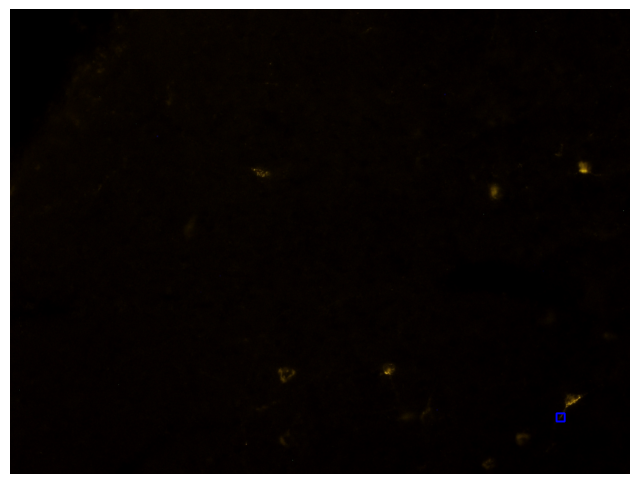

In [13]:
from skimage import measure, draw
import cv2

bbox_enlargement = 5
# for image_row in objects_to_check.itertuples():
for image_name in objects_to_check.image_name.unique():
    image_row = objects_to_check[objects_to_check.image_name == image_name].iloc[0]
    mask_path = DATA_PATH / image_row.dataset / image_row.partition / "ground_truths/masks" / image_row.image_name
    image_path = DATA_PATH / image_row.dataset / image_row.partition / "images" / image_row.image_name
    binary_mask = io.imread(mask_path, as_gray=True)
    image = io.imread(image_path)
    labels = measure.label(binary_mask)
#     labels = measure.label(binary_mask, connectivity=1) # this generates more small objects because of diagonal pixels
    props = measure.regionprops(labels)
    print(image_path.name)
    
    small_obj = 0
    for prop in props:
        if prop.area < AREA_THRESHOLD:
            small_obj += 1
            print("object area:", prop.area)
            minr, minc, maxr, maxc = prop.bbox
            minr, minc, maxr, maxc = minr - bbox_enlargement, minc - bbox_enlargement, maxr + bbox_enlargement, maxc + bbox_enlargement  # make the bounding box larger

            # Clip the values to be within the image dimensions
            minr, minc, maxr, maxc = max(minr, 0), max(minc, 0), min(maxr, image.shape[0]), min(maxc, image.shape[1])

            # Draw thick blue contour on the RGB image
            _ = cv2.rectangle(image, (minc, minr), (maxc, maxr), (0, 0, 255), thickness=3)

    if small_obj:
        small_obj = 0
        plt.imshow(image)
        plt.axis('off')
        plt.show()

In [14]:
raw_stats = pd.merge(cell_stats_df,
                     signal_pct_df[["image_name", "class1_to_total"]],
                     on="image_name")

In [15]:
# convert from pixel to um based on resolution from metadata
def _convert_pixels_to_micron(stats_df, meta_df):
    _temp = pd.merge(stats_df,
                     meta_df[["image_name", "resolution_px_um"]],
                     on="image_name")
    # we need to divide twice for the area (um^2)
    stats_df.loc[:, "area"] = stats_df["area"] / _temp["resolution_px_um"]
    return stats_df[stats_df.columns[1:]].div(_temp["resolution_px_um"],
                                              axis=0)


meta_df = pd.read_excel(DATA_PATH /
                        f"metadata_{METADATA['current_version']}.xlsx",
                        sheet_name="metadata")
measure_cols = list(cell_stats_df.columns[5:])
cell_stats_df[cell_stats_df.columns[5:]] = _convert_pixels_to_micron(
    cell_stats_df[["image_name"] + measure_cols], meta_df)
cell_stats_df

/tmp/ipykernel_25553/2555628602.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  stats_df.loc[:, "area"] = stats_df["area"] / _temp["resolution_px_um"]


,image_name,dataset,partition,n_cells,cell_id,area,min_axis_length,max_axis_length,equivalent_diameter,feret_diameter_max
0,177.png,green,trainval,43.00,0.00,55.92,6.15,11.74,8.44,11.88
1,177.png,green,trainval,43.00,1.00,53.85,7.41,9.43,8.28,10.01
2,177.png,green,trainval,43.00,2.00,57.50,7.02,10.56,8.56,10.98
3,177.png,green,trainval,43.00,3.00,39.97,6.01,8.62,7.13,9.36
4,177.png,green,trainval,43.00,4.00,50.21,6.93,9.34,8.00,9.91
...,...,...,...,...,...,...,...,...,...,...
11315,876.png,yellow,test,47.00,42.00,321.45,16.59,26.66,20.23,29.24
11316,876.png,yellow,test,47.00,43.00,185.59,14.48,16.42,15.37,16.92
11317,876.png,yellow,test,47.00,44.00,212.66,12.71,24.05,16.46,23.23
11318,876.png,yellow,test,47.00,45.00,259.72,12.63,27.46,18.18,29.66


In [16]:
summary = cell_stats_df.groupby(["dataset"]).describe(percentiles=qq)
summary_table_objects_univariate = summary.transpose().reset_index().set_index(
    'level_1')
summary_table_objects_univariate

dataset,level_0,green,red,yellow
level_1,,,,
count,n_cells,"4,606.00","4,473.00","2,241.00"
mean,n_cells,28.65,34.77,27.97
std,n_cells,17.49,17.69,22.64
min,n_cells,0.00,0.00,0.00
10%,n_cells,9.00,14.00,4.00
...,...,...,...,...
25%,feret_diameter_max,10.88,18.66,13.18
50%,feret_diameter_max,12.07,24.44,16.63
75%,feret_diameter_max,13.35,31.04,21.88


In [17]:
variables = summary_table_objects_univariate.level_0.unique()
summary_table_objects_univariate_wide = pd.DataFrame()

for var in variables[0:]:

    idx = _create_multiindex_univariate(var)

    summary_table_objects_wide_update = summary_table_objects_univariate[
        summary_table_objects_univariate.level_0 == var]
    summary_table_objects_wide_update.columns = idx
    summary_table_objects_wide_update.drop("variable", axis=1, inplace=True)

    summary_table_objects_univariate_wide = pd.concat([
        summary_table_objects_univariate_wide,
        summary_table_objects_wide_update
    ],
                                                      axis=1)

summary_table_objects_univariate_wide.index.name = "statistic"
summary_table_objects_univariate_wide

/tmp/ipykernel_25553/1024370931.py:11: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  summary_table_objects_wide_update.drop("variable", axis=1, inplace=True)
/tmp/ipykernel_25553/1024370931.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  summary_table_objects_wide_update.drop("variable", axis=1, inplace=True)
/tmp/ipykernel_25553/1024370931.py:11: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  summary_table_objects_wide_update.drop("variable", axis=1, inplace=True)
/tmp/ipykernel_25553/1024370931.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/

feature    n_cells                    cell_id                       area  \
dataset      green      red   yellow    green      red   yellow    green   
statistic                                                                  
count     4,606.00 4,473.00 2,241.00 4,600.00 4,470.00 2,189.00 4,600.00   
mean         28.65    34.77    27.97    13.84    16.90    13.82    74.78   
std          17.49    17.69    22.64    13.05    14.32    15.39    23.39   
min           0.00     0.00     0.00     0.00     0.00     0.00    12.41   
10%           9.00    14.00     4.00     1.00     2.00     0.00    48.74   
25%          15.00    21.00     7.00     4.00     6.00     2.00    58.58   
50%          25.00    31.00    21.00    10.00    13.00     7.00    71.67   
75%          39.75    50.00    51.00    20.00    24.00    21.00    87.33   
90%          56.00    58.00    60.00    33.00    38.00    39.00   104.66   
max          69.00    89.00    69.00    68.00    88.00    68.00   227.04   

feature                     min_axis_length                   max_axis_length  \
dataset        red   yellow           green      red   yellow           green   
statistic                                                                       
count     4,470.00 2,189.00        4,600.00 4,470.00 2,189.00        4,600.00   
mean        247.23   144.09            8.22    13.20    10.36           11.62   
std         130.74   109.39            1.53     3.89     3.90            1.91   
min          24.81     6.30            3.26     4.58     2.15            5.29   
10%         107.21    47.75            6.39     8.68     6.08            9.28   
25%         144.53    73.45            7.18    10.32     7.59           10.29   
50%         219.57   111.84            8.08    12.60     9.67           11.51   
75%         320.99   179.09            9.13    15.47    12.45           12.78   
90%         423.11   278.47           10.20    18.61    15.47           14.04   
max         842.66   887.76           15.21    32.23    29.85           22.97   

feature                     equivalent_diameter                    \
dataset        red   yellow               green      red   yellow   
statistic                                                           
count     4,470.00 2,189.00            4,600.00 4,470.00 2,189.00   
mean         24.55    17.25                9.64    17.16    12.77   
std           8.58     7.15                1.48     4.51     4.50   
min           6.56     3.52                3.97     5.62     2.83   
10%          14.89     9.93                7.88    11.68     7.80   
25%          17.78    12.55                8.64    13.57     9.67   
50%          23.21    15.74                9.55    16.72    11.93   
75%          29.69    20.35               10.54    20.22    15.10   
90%          36.21    26.21               11.54    23.21    18.83   
max          73.57    64.57               17.00    32.76    33.62   

feature   feret_diameter_max                    
dataset                green      red   yellow  
statistic                                       
count               4,600.00 4,470.00 2,189.00  
mean                   12.20    25.72    18.50  
std                     1.92     8.88     8.18  
min                     5.48     7.08     3.79  
10%                     9.85    15.69    10.47  
25%                    10.88    18.66    13.18  
50%                    12.07    24.44    16.63  
75%                    13.35    31.04    21.88  
90%                    14.70    37.70    28.32  
max                    21.21    74.39    68.51

In [18]:
paper_measures = [
    "n_cells", "area", "feret_diameter_max", "equivalent_diameter"
]

global_summary_univariate = pd.concat([
    summary_table_univariate,
    summary_table_objects_univariate_wide[paper_measures]
],
                                      axis=1)
global_summary_univariate

feature signal %                n_cells                       area           \
dataset    green    red yellow    green      red   yellow    green      red   
count     283.00 184.00 283.00 4,606.00 4,473.00 2,241.00 4,600.00 4,470.00   
mean        0.64   2.61   0.59    28.65    34.77    27.97    74.78   247.23   
std         0.57   1.74   0.72    17.49    17.69    22.64    23.39   130.74   
min         0.00   0.00   0.00     0.00     0.00     0.00    12.41    24.81   
10%         0.10   0.37   0.00     9.00    14.00     4.00    48.74   107.21   
25%         0.25   1.34   0.10    15.00    21.00     7.00    58.58   144.53   
50%         0.45   2.34   0.42    25.00    31.00    21.00    71.67   219.57   
75%         0.92   3.53   0.80    39.75    50.00    51.00    87.33   320.99   
90%         1.38   4.89   1.28    56.00    58.00    60.00   104.66   423.11   
max         3.36   8.40   5.75    69.00    89.00    69.00   227.04   842.66   

feature          feret_diameter_max                   equivalent_diameter  \
dataset   yellow              green      red   yellow               green   
count   2,189.00           4,600.00 4,470.00 2,189.00            4,600.00   
mean      144.09              12.20    25.72    18.50                9.64   
std       109.39               1.92     8.88     8.18                1.48   
min         6.30               5.48     7.08     3.79                3.97   
10%        47.75               9.85    15.69    10.47                7.88   
25%        73.45              10.88    18.66    13.18                8.64   
50%       111.84              12.07    24.44    16.63                9.55   
75%       179.09              13.35    31.04    21.88               10.54   
90%       278.47              14.70    37.70    28.32               11.54   
max       887.76              21.21    74.39    68.51               17.00   

feature                    
dataset      red   yellow  
count   4,470.00 2,189.00  
mean       17.16    12.77  
std         4.51     4.50  
min         5.62     2.83  
10%        11.68     7.80  
25%        13.57     9.67  
50%        16.72    11.93  
75%        20.22    15.10  
90%        23.21    18.83  
max        32.76    33.62

## Dataset x Partition

This section inspects summary statistics grouped by dataset and partition (i.e. data split).

### Class imbalance

In [19]:
def _create_multiindex(var):

    idx = pd.MultiIndex.from_tuples([('variable', '', ''),
                                     (var, 'green', 'test'),
                                     (var, 'green', 'trainval'),
                                     (var, 'red', 'test'),
                                     (var, 'red', 'trainval'),
                                     (var, 'yellow', 'test'),
                                     (var, 'yellow', 'trainval')],
                                    names=['feature', 'dataset', 'partition'])
    return idx


summary = signal_pct_df.groupby(["dataset",
                                 "partition"]).describe(percentiles=qq)

summary_table = summary.transpose().reset_index().set_index('level_1')
summary_table = summary_table[summary_table.level_0 == "class1_to_total"]
summary_table.index.name = "statistics"
idx = _create_multiindex("signal %")
summary_table.columns = idx
summary_table.drop("variable", axis=1, inplace=True)
summary_table

/tmp/ipykernel_25553/80090785.py:22: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  summary_table.drop("variable", axis=1, inplace=True)


feature    signal %                                        
dataset       green            red          yellow         
partition      test trainval  test trainval   test trainval
statistics                                                 
count         70.00   213.00 46.00   138.00  70.00   213.00
mean           0.64     0.64  2.78     2.56   0.82     0.51
std            0.59     0.56  2.06     1.62   1.05     0.55
min            0.00     0.00  0.00     0.00   0.00     0.00
10%            0.08     0.12  0.53     0.39   0.00     0.00
25%            0.24     0.25  1.31     1.40   0.24     0.09
50%            0.45     0.45  2.34     2.34   0.56     0.39
75%            0.92     0.92  3.91     3.52   0.94     0.75
90%            1.41     1.33  5.60     4.53   1.74     1.15
max            2.73     3.36  8.40     7.13   5.75     3.41

### Object features

In [20]:
summary = cell_stats_df.groupby(["dataset",
                                 "partition"]).describe(percentiles=qq)
summary_table_objects = summary.transpose().reset_index().set_index('level_1')
summary_table_objects

dataset               level_0    green               red          yellow  \
partition                         test trainval     test trainval   test   
level_1                                                                    
count                 n_cells 1,174.00 3,432.00 1,186.00 3,287.00 717.00   
mean                  n_cells    31.20    27.78    38.45    33.45  28.61   
std                   n_cells    19.87    16.51    21.01    16.13  20.29   
min                   n_cells     0.00     0.00     0.00     0.00   0.00   
10%                   n_cells     9.30     9.00    16.00    14.00   5.00   
...                       ...      ...      ...      ...      ...    ...   
25%        feret_diameter_max    10.84    10.89    18.42    18.77  14.31   
50%        feret_diameter_max    12.01    12.11    23.71    24.70  17.62   
75%        feret_diameter_max    13.19    13.47    30.94    31.06  22.46   
90%        feret_diameter_max    14.34    14.85    37.81    37.68  29.01   
max        feret_diameter_max    19.41    21.21    70.67    74.39  68.51   

dataset             
partition trainval  
level_1             
count     1,524.00  
mean         27.67  
std          23.67  
min           0.00  
10%           3.00  
...            ...  
25%          12.62  
50%          16.10  
75%          21.49  
90%          28.19  
max          68.25  

[70 rows x 7 columns]

In [21]:
variables = summary_table_objects.level_0.unique()
summary_table_objects_wide = pd.DataFrame()

for var in variables[0:]:

    idx = _create_multiindex(var)

    summary_table_objects_wide_update = summary_table_objects[
        summary_table_objects.level_0 == var]
    summary_table_objects_wide_update.columns = idx
    summary_table_objects_wide_update.drop("variable", axis=1, inplace=True)

    summary_table_objects_wide = pd.concat(
        [summary_table_objects_wide, summary_table_objects_wide_update],
        axis=1)

summary_table_objects_wide.index.name = "statistic"
summary_table_objects_wide

/tmp/ipykernel_25553/3554094531.py:11: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  summary_table_objects_wide_update.drop("variable", axis=1, inplace=True)
/tmp/ipykernel_25553/3554094531.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  summary_table_objects_wide_update.drop("variable", axis=1, inplace=True)
/tmp/ipykernel_25553/3554094531.py:11: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  summary_table_objects_wide_update.drop("variable", axis=1, inplace=True)
/tmp/ipykernel_25553/3554094531.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/

feature    n_cells                                             cell_id  \
dataset      green               red          yellow             green   
partition     test trainval     test trainval   test trainval     test   
statistic                                                                
count     1,174.00 3,432.00 1,186.00 3,287.00 717.00 1,524.00 1,172.00   
mean         31.20    27.78    38.45    33.45  28.61    27.67    15.13   
std          19.87    16.51    21.01    16.13  20.29    23.67    14.58   
min           0.00     0.00     0.00     0.00   0.00     0.00     0.00   
10%           9.30     9.00    16.00    14.00   5.00     3.00     1.00   
25%          15.00    14.00    25.00    20.50   9.00     6.00     4.00   
50%          26.00    23.00    33.00    30.00  27.00    19.00    11.00   
75%          40.00    39.00    56.00    50.00  44.00    53.00    21.00   
90%          66.00    55.00    66.00    57.00  52.00    60.00    36.00   
max          69.00    67.00    89.00    65.00  68.00    69.00    68.00   

feature                                                  area           \
dataset                 red          yellow             green            
partition trainval     test trainval   test trainval     test trainval   
statistic                                                                
count     3,428.00 1,185.00 3,285.00 705.00 1,484.00 1,172.00 3,428.00   
mean         13.41    18.74    16.23  14.05    13.71    72.59    75.53   
std          12.45    16.44    13.41  14.33    15.87    20.29    24.31   
min           0.00     0.00     0.00   0.00     0.00    23.24    12.41   
10%           1.00     2.00     2.00   1.00     0.00    49.43    48.44   
25%           4.00     6.00     6.00   3.00     2.00    58.97    58.38   
50%          10.00    15.00    13.00   9.00     7.00    70.05    72.27   
75%          19.00    26.00    23.00  22.00    20.00    83.34    88.81   
90%          31.00    41.60    36.00  35.00    40.00    97.47   106.36   
max          66.00    88.00    64.00  67.00    68.00   186.08   227.04   

feature                                     min_axis_length                    \
dataset        red          yellow                    green               red   
partition     test trainval   test trainval            test trainval     test   
statistic                                                                       
count     1,185.00 3,285.00 705.00 1,484.00        1,172.00 3,428.00 1,185.00   
mean        246.25   247.59 154.45   139.17            8.10     8.26    13.20   
std         132.37   130.17 105.61   110.84            1.39     1.58     3.92   
min          50.41    24.81   6.30     8.07            3.57     3.26     5.38   
10%         108.55   106.06  58.68    44.50            6.41     6.37     8.80   
25%         142.27   145.22  81.82    68.48            7.18     7.19    10.37   
50%         214.21   221.18 130.65   105.59            7.99     8.12    12.61   
75%         322.70   320.19 191.99   171.19            8.95     9.22    15.47   
90%         426.63   422.44 281.17   275.13            9.82    10.29    18.65   
max         842.66   822.57 887.76   885.70           13.37    15.21    32.23   

feature                            max_axis_length                             \
dataset            yellow                    green               red            
partition trainval   test trainval            test trainval     test trainval   
statistic                                                                       
count     3,285.00 705.00 1,484.00        1,172.00 3,428.00 1,185.00 3,285.00   
mean         13.19  10.93    10.09           11.50    11.66    24.52    24.55   
std           3.88   3.79     3.92            1.76     1.96     8.89     8.47   
min           4.58   2.15     2.78            6.59     5.29    10.35     6.56   
10%           8.65   6.69     5.86            9.34     9.25    15.11    14.81   
25%          10.31   8.16     7.44           10.28    10.29   

In [22]:
paper_measures = [
    "n_cells", "area", "feret_diameter_max", "equivalent_diameter"
]

global_summary = pd.concat(
    [summary_table, summary_table_objects_wide[paper_measures]], axis=1)
global_summary

feature   signal %                                          n_cells           \
dataset      green            red          yellow             green            
partition     test trainval  test trainval   test trainval     test trainval   
count        70.00   213.00 46.00   138.00  70.00   213.00 1,174.00 3,432.00   
mean          0.64     0.64  2.78     2.56   0.82     0.51    31.20    27.78   
std           0.59     0.56  2.06     1.62   1.05     0.55    19.87    16.51   
min           0.00     0.00  0.00     0.00   0.00     0.00     0.00     0.00   
10%           0.08     0.12  0.53     0.39   0.00     0.00     9.30     9.00   
25%           0.24     0.25  1.31     1.40   0.24     0.09    15.00    14.00   
50%           0.45     0.45  2.34     2.34   0.56     0.39    26.00    23.00   
75%           0.92     0.92  3.91     3.52   0.94     0.75    40.00    39.00   
90%           1.41     1.33  5.60     4.53   1.74     1.15    66.00    55.00   
max           2.73     3.36  8.40     7.13   5.75     3.41    69.00    67.00   

feature                                         area                    \
dataset        red          yellow             green               red   
partition     test trainval   test trainval     test trainval     test   
count     1,186.00 3,287.00 717.00 1,524.00 1,172.00 3,428.00 1,185.00   
mean         38.45    33.45  28.61    27.67    72.59    75.53   246.25   
std          21.01    16.13  20.29    23.67    20.29    24.31   132.37   
min           0.00     0.00   0.00     0.00    23.24    12.41    50.41   
10%          16.00    14.00   5.00     3.00    49.43    48.44   108.55   
25%          25.00    20.50   9.00     6.00    58.97    58.38   142.27   
50%          33.00    30.00  27.00    19.00    70.05    72.27   214.21   
75%          56.00    50.00  44.00    53.00    83.34    88.81   322.70   
90%          66.00    57.00  52.00    60.00    97.47   106.36   426.63   
max          89.00    65.00  68.00    69.00   186.08   227.04   842.66   

feature                            feret_diameter_max                    \
dataset            yellow                       green               red   
partition trainval   test trainval               test trainval     test   
count     3,285.00 705.00 1,484.00           1,172.00 3,428.00 1,185.00   
mean        247.59 154.45   139.17              12.08    12.24    25.60   
std         130.17 105.61   110.84               1.77     1.97     9.15   
min          24.81   6.30     8.07               7.16     5.48    10.65   
10%         106.06  58.68    44.50               9.97     9.83    15.77   
25%         145.22  81.82    68.48              10.84    10.89    18.42   
50%         221.18 130.65   105.59              12.01    12.11    23.71   
75%         320.19 191.99   171.19              13.19    13.47    30.94   
90%         422.44 281.17   275.13              14.34    14.85    37.81   
max         822.57 887.76   885.70              19.41    21.21    70.67   

feature                            equivalent_diameter                    \
dataset            yellow                        green               red   
partition trainval   test trainval                test trainval     test   
count     3,285.00 705.00 1,484.00            1,172.00 3,428.00 1,185.00   
mean         25.76  19.33    18.10                9.52     9.69    17.12   
std           8.78   7.56     8.44                1.31     1.54     4.54   
min           7.08   3.79     4.19                5.44     3.97     8.01   
10%          15.67  11.89    10.05                7.93     7.85    11.76   
25%          18.77  14.31    12.62                8.67     8.62    13.46   
50%          24.70  17.62    16.10                9.44     9.59    16.51   
75%          31.06  22.46    21.49               10.30    10.63    20.27   
90%          37.68  29.01    28.19               11.14    11.64    23.31   
max          74.39  68.51    68.25               15.39    17.00    32.76   

feature                        

### Export


In [23]:
raw_stats.to_csv(DATA_PATH / "dataset_features.csv", index=False)

# univariate
global_summary_univariate.to_csv(DATA_PATH / "aggregate_dataset_features.csv")

# dataset X partition
global_summary.to_csv(DATA_PATH / "aggregate_datasetXpartition_features.csv")

## Plot distributions 

In [24]:
raw_stats

,image_name,dataset,partition,n_cells,cell_id,area,min_axis_length,max_axis_length,equivalent_diameter,feret_diameter_max,class1_to_total
0,177.png,green,trainval,43.00,0.00,568.00,19.61,37.41,26.89,37.85,1.21
1,177.png,green,trainval,43.00,1.00,547.00,23.62,30.05,26.39,31.91,1.21
2,177.png,green,trainval,43.00,2.00,584.00,22.38,33.64,27.27,34.99,1.21
3,177.png,green,trainval,43.00,3.00,406.00,19.16,27.46,22.74,29.83,1.21
4,177.png,green,trainval,43.00,4.00,510.00,22.09,29.75,25.48,31.58,1.21
...,...,...,...,...,...,...,...,...,...,...,...
11315,876.png,yellow,test,47.00,42.00,"3,265.00",52.86,84.97,64.48,93.19,5.75
11316,876.png,yellow,test,47.00,43.00,"1,885.00",46.16,52.34,48.99,53.94,5.75
11317,876.png,yellow,test,47.00,44.00,"2,160.00",40.49,76.64,52.44,74.04,5.75
11318,876.png,yellow,test,47.00,45.00,"2,638.00",40.25,87.52,57.96,94.53,5.75


In [25]:
colors = {"green": '#067b26', "red": '#e11b01', "yellow": '#f9f814'}
datasets = ["green", "yellow", "red"]

unit_dict = {
    "class1_to_total": "value (%)",
    "area": "value $(\mu m^2)$",
    "n_cells": "count"
}

title_dict = {
    "class1_to_total": "Cell % over total pixels",
    "area": "Cell area",
    "n_cells": "Number of cells"
}


def _format_annotation_text(text):
    return text.rstrip('0').rstrip('.')


def plot_boxplot(boxplot_data: list[pd.Series], colors: dict,
                 quantiles: np.array):
    feature = boxplot_data[0].name
    ymax = max(max(boxplot_data[0]), max(boxplot_data[1]), max(
        boxplot_data[2])) + 5
    boxprops = dict(linewidth=2, color='black')
    whiskerprops = dict(linewidth=2, color='black')
    capprops = dict(linewidth=2, color='black')
    medianprops = dict(linewidth=2, color='#4287f5', linestyle='dashed')
    meanprops = dict(marker='o',
                     markeredgecolor='#a8a8a8',
                     markerfacecolor='#5f27cd')
    fig, ax = plt.subplots()

    box_shift = np.arange(1, 7, 2)
    # NOTE: don't accept NaNs
    boxplot = ax.boxplot(boxplot_data,
                         labels=['Green', 'Yellow', 'Red'],
                         patch_artist=True,
                         showfliers=True,
                         boxprops=boxprops,
                         whiskerprops=whiskerprops,
                         capprops=capprops,
                         medianprops=medianprops,
                         meanprops=meanprops,
                         meanline=True,
                         vert=True,
                         positions=box_shift)

    all_data = list(boxplot_data[0].values) + list(
        boxplot_data[1].values) + list(boxplot_data[2].values)
    q_values = np.linspace(0, 100, 8)
    yticks = np.percentile(all_data, q_values)
    yticks = np.insert(yticks, 0, 0)

    #     quantiles = quantiles * 100
    # #     quantiles = np.insert(quantiles, 0, 0)
    # #     quantiles = np.append(quantiles, 100)
    #     q_values = [np.nanpercentile(data, quantiles) for data in boxplot_data]
    #     q_values = np.unique(q_values)
    _ = plt.xticks(box_shift, ['Green', 'Yellow', 'Red'])
    _ = plt.xlim(0, box_shift.max() + 1)
    _ = plt.xlabel("Dataset")
    _ = plt.yticks(yticks,
                   [_format_annotation_text(f"{q:.2f}") for q in yticks])
    _ = plt.ylim(0, ymax)
    _ = plt.ylabel(unit_dict[feature])
    _ = plt.title(title_dict[feature].title())
    _ = plt.tight_layout()

    # Color the boxes based on dataset value
    for i, box in enumerate(boxplot['boxes']):
        color = colors.get(datasets[i])
        _ = plt.setp(box, facecolor=color)


#     # Add text annotation for quantiles
#     quantiles = quantiles * 100
#     quantile_labels = [f"q{int(q)}" for q in quantiles]
#     quantiles = np.insert(quantiles, 0, 0)
#     quantiles = np.append(quantiles, 100)
#     quantile_labels.insert(0, "min")
#     quantile_labels = np.append(quantile_labels, "max")
#     box_shift = [1, 3, 5]
#     for i, box in enumerate(boxplot['boxes']):
#         # Get the quantiles for each box
#         q_values = np.nanpercentile(boxplot_data[i], quantiles)
#         # Add text annotation for each quantile
#         for j, q in enumerate(q_values):
#             label_shift = -1#(-1)**(2 - j%2)
#             _ = plt.text(
#                box_shift[i] + label_shift*0.6,
#                 q,
#                 f"{quantile_labels[j]}: {_format_annotation_text(f'{q:.1f}')}",
#                 ha='center',
#                 va='center')

    return fig

In [26]:
# data = {
#     'dataset': ["green","green","green","green","green",
#                "yellow","yellow","yellow","yellow","yellow",
#                "red","red","red","red","red"],
#     'area': [3, 4.1, 0.2, 1, 2,
#                 4, 7, 1, 0.1, 0.3,
#                 7, 9, 9, 4, 3],
#     'n_cells': [100, 11, 5, 67, 49,
#                 12, 17, 34, 2, 0,
#                34, 57, 9, 8, 13],
# }
# df = pd.DataFrame(data)

# boxplot_data = [
#     df[df['dataset'] == 'green']['area'],
#     df[df['dataset'] == 'yellow']['area'],
#     df[df['dataset'] == 'red']['area']
# ]

# plot_boxplot(boxplot_data, colors, np.array(qq))

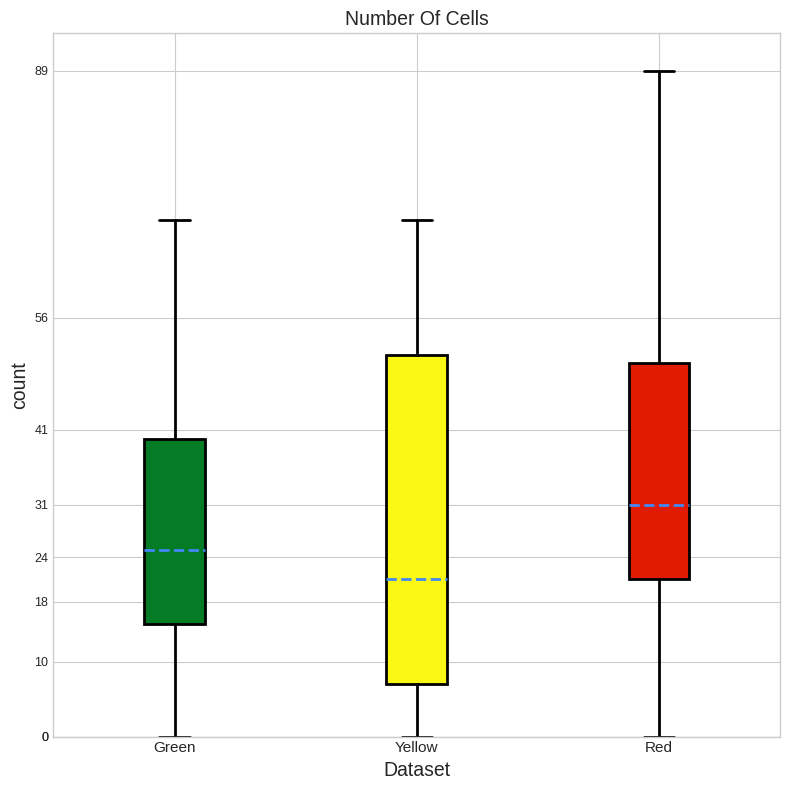

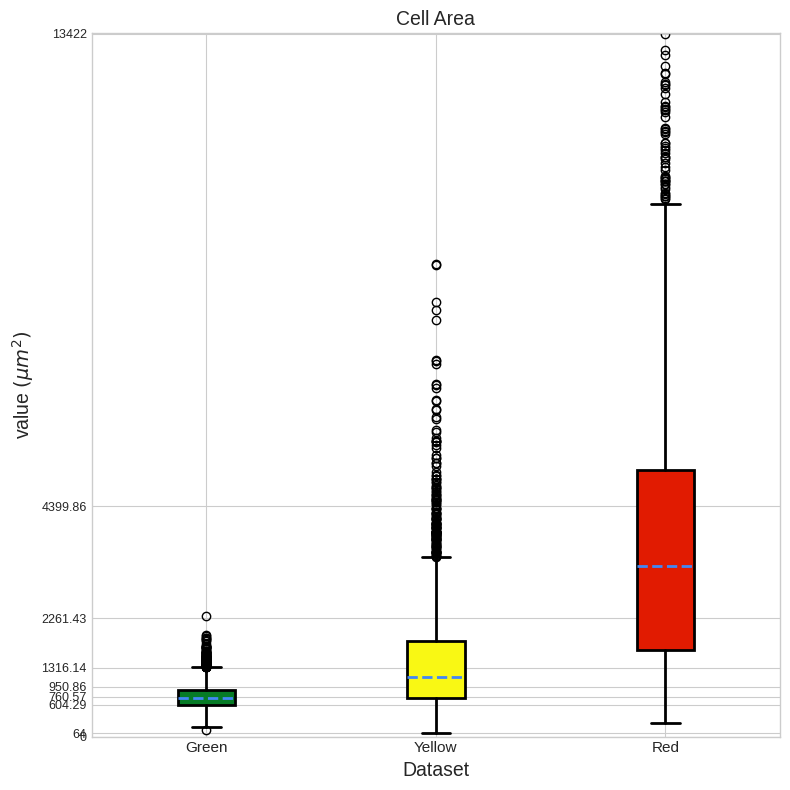

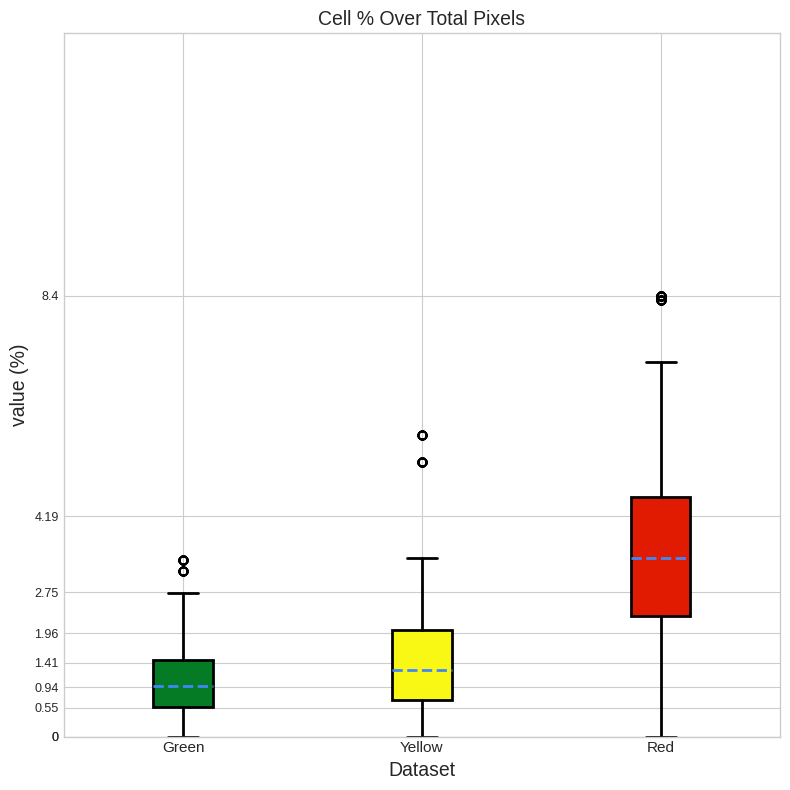

In [27]:
FIGURES_PATH = REPO_PATH / "figures"
columns_to_plot = ['n_cells', 'area', 'class1_to_total']
# columns_to_plot = ['area']

# size = 14
# params = {'legend.fontsize': 'large',
# #           'font.family': "Helvetica",
#           'figure.figsize': (8, 8),
#           'axes.labelsize': size,
#           'axes.titlesize': size,
#           'xtick.labelsize': size*0.7,
#           'ytick.labelsize': size*0.7,
#           # 'axes.titlepad': 25
#           }
# plt.rcParams.update(params)


for feature in columns_to_plot:
    if feature=="area":
        relevant_raw_stats = raw_stats.loc[~raw_stats[feature].isna(), ["dataset", feature]]
    else:
        relevant_raw_stats = raw_stats.copy()
        
    boxplot_data = [
        relevant_raw_stats[relevant_raw_stats['dataset'] == 'green'][feature],
        relevant_raw_stats[relevant_raw_stats['dataset'] == 'yellow'][feature],
        relevant_raw_stats[relevant_raw_stats['dataset'] == 'red'][feature]
    ]
#     annotated_quantiles = qq.copy()
#     annotated_quantiles.insert(0, 0)
#     annotated_quantiles.insert(len(annotated_quantiles), 1)
#     fig = plot_boxplot(boxplot_data, colors, np.array(annotated_quantiles))
    fig = plot_boxplot(boxplot_data, colors, np.array(qq))
    _ = plt.savefig(FIGURES_PATH / f"{feature}_boxplots.pdf",
                    format='pdf',
                    bbox_inches='tight',
                    pad_inches=0)
    

# Challenges

In [28]:
from fluocells.utils.annotations import load_VIA_annotations, _convert_from_VIA_polygon

CHALLENGES_PATH = REPO_PATH / "figures/challenges"
challenges_df = load_VIA_annotations(CHALLENGES_PATH / "challenges.csv")
challenges_df

,filename,file_size,file_attributes,region_count,region_id,region_shape_attributes,region_attributes
0,1096.png,1743307,{},6,0,"{'name': 'polygon', 'all_points_x': [879, 900, 915, 928, 940, 946, 929, 913, 882, 858, 838, 819, 787, 751, 730, 722, 740, 762, 788, 807, 822, 838, 857, 861, 856, 859, 868], 'all_points_y': [536, 525, 507, 479, 449, 413, 393, 383, 375, 379, 388, 395, 393, 397, 412, 429, 445, 454, 449, 449, 455, 459, 460, 469, 483, 513, 529]}",{'challenge': 'overcrowding'}
1,1096.png,1743307,{},6,1,"{'name': 'polygon', 'all_points_x': [960, 984, 1009, 1040, 1090, 1082, 1049, 1011, 1005, 969, 935, 915, 899, 873, 841, 828, 840, 864, 883, 876, 893, 920, 940], 'all_points_y': [777, 779, 762, 752, 730, 704, 699, 677, 651, 646, 656, 645, 622, 604, 616, 640, 671, 677, 679, 704, 733, 738, 767]}",{'challenge': 'overcrowding'}
2,1096.png,1743307,{},6,2,"{'name': 'polygon', 'all_points_x': [341, 378, 410, 384, 348, 324], 'all_points_y': [617, 609, 558, 543, 547, 591]}",{'challenge': 'marked cell'}
3,1096.png,1743307,{},6,3,"{'name': 'polygon', 'all_points_x': [473, 511, 525, 492, 469, 440, 441, 453], 'all_points_y': [1051, 1045, 999, 970, 971, 994, 1028, 1045]}",{'challenge': 'marked cell'}
4,1096.png,1743307,{},6,4,"{'name': 'polygon', 'all_points_x': [165, 207, 247, 212, 176, 152], 'all_points_y': [1094, 1104, 1066, 1040, 1036, 1056]}",{'challenge': 'non-marked cell'}
...,...,...,...,...,...,...,...
29,309.png,588763,{},5,0,"{'name': 'polygon', 'all_points_x': [346, 392, 465, 511, 509, 490, 452, 406, 350, 306, 271, 274, 267, 278], 'all_points_y': [796, 802, 785, 746, 685, 626, 589, 574, 540, 540, 611, 650, 699, 745]}",{'challenge': 'overcrowding'}
30,309.png,588763,{},5,1,"{'name': 'polygon', 'all_points_x': [236, 135, 137, 154, 163, 177, 179, 177, 122, 93, 4, 5, 62, 98, 150, 210, 248, 283, 263, 239], 'all_points_y': [1194, 1196, 1114, 1056, 963, 878, 731, 665, 576, 531, 495, 436, 432, 464, 514, 617, 679, 809, 915, 1109]}",{'challenge': 'stripe'}
31,309.png,588763,{},5,2,"{'name': 'polygon', 'all_points_x': [1048, 1058, 1067, 1028, 979, 952, 969, 1025], 'all_points_y': [565, 546, 519, 465, 469, 506, 564, 577]}",{'challenge': 'artifact'}
32,309.png,588763,{},5,3,"{'name': 'polygon', 'all_points_x': [385, 356, 322, 309, 335, 380, 413, 426, 411], 'all_points_y': [907, 909, 891, 859, 839, 827, 837, 862, 899]}",{'challenge': 'marked cell'}


In [29]:
color_text = ["#02c4cb", "#c6aa0e"]
palette = ["#00FF00", "#faf9f9", "#28afb0", "#f4d35e", "#F73CF9",
           "#F74142"]  #0000F5
# palette = ["f2d5f8","e07a5f","3d405b","81b29a","f2cc8f","e6c0e9"]
palette = ["#00FF00", "#f4d35e", "#f2d5f8", "#C977CF", "#1461f0", "#F74142"]
categories = [
    'stripe', 'artifact', 'marked cell', 'non-marked cell', 'filament',
    'overcrowding'
]
palette_dict = {cat: c for cat, c in zip(categories, palette)}

size = 18
params = {
    'legend.fontsize': 'large',
    #           'font.family': "Helvetica",
    'figure.figsize': (8, 8),
    'axes.labelsize': size,
    'axes.titlesize': size,
    'xtick.labelsize': size * 0.9,
    'ytick.labelsize': size * 0.9,
    # 'axes.titlepad': 25
}
plt.rcParams.update(params)

text_annotations = {
    "1096.png": {
        "labels": [
            "overcrowding", "marked cell", "marked cell", "non-marked cell",
            "non-marked cell"
        ],
        "coordinates": [[900, 580], [300, 520], [440, 940], [1400, 230],
                        [140, 990]]
    },
    "1025.png": {
        "labels": ["stripe", "filaments"],
        "coordinates": [[1400, 200], [1300, 560]]
    },
    "905.png": {
        "labels": ["dot-artifacts", "fluorophore\naccumulation"],
        "coordinates": [[1240, 530], [800, 700]]
    },
    "311.png": {
        "labels": [
            "overcrowding", "marked cell", "non-marked cell", "filament",
            "dot-artifact"
        ],
        "coordinates": [[800, 900], [1700, 460], [1450, 670], [1800, 1280],
                        [1900, 50]]
    },
    "128.png": {
        "labels": ["fluorophore\naccumulation"],
        "coordinates": [[900, 970]]
    },
    "177.png": {
        "labels": [
            "overcrowding", "marked cell", "marked cell", "non-marked cell",
            "non-marked cell", "stripe", "dot-artifact", "dot-artifact"
        ],
        "coordinates": [[700, 600], [900, 520], [1150, 970], [1100, 750],
                        [1450, 770], [170, 420], [410, 900], [1550, 450]]
    },
    "309.png": {
        "labels": [
            "overcrowding", "stripe", "marked cell", "non-marked cell",
            "fluorophore\naccumulation"
        ],
        "coordinates": [[300, 500], [100, 700], [450, 930], [380, 1070],
                        [1000, 400]]
    },
}

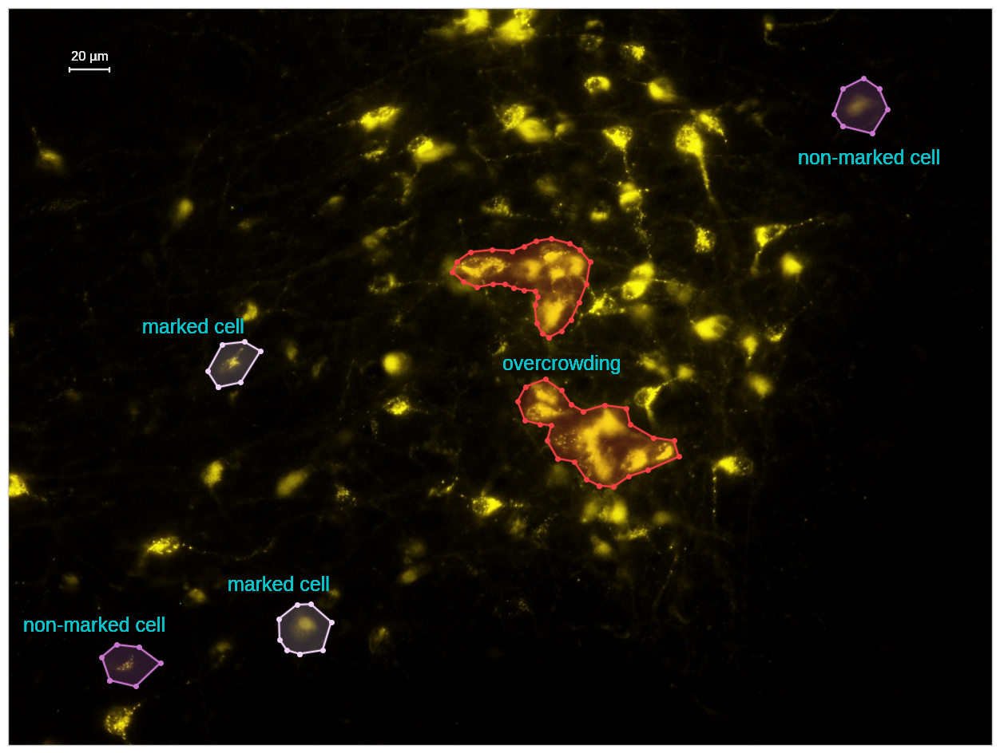

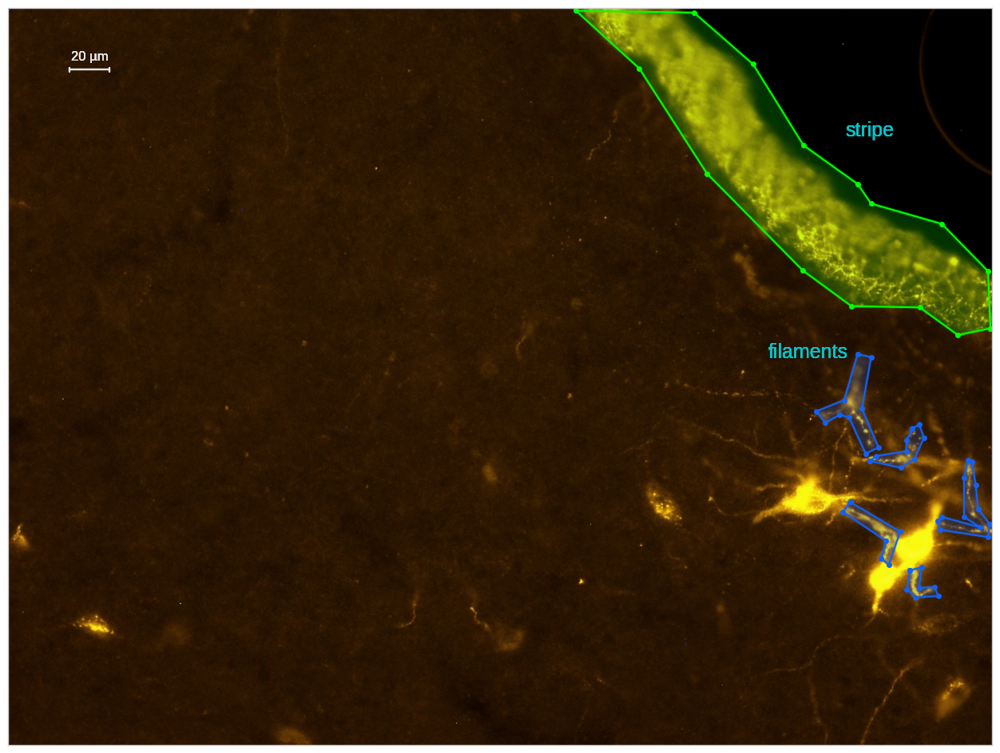

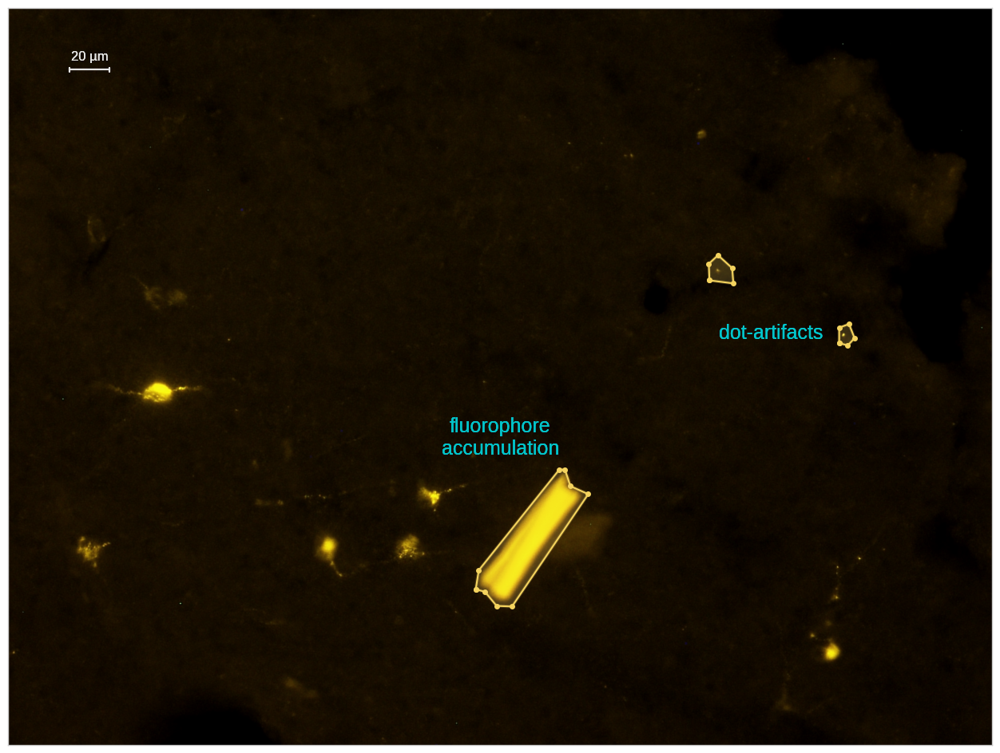

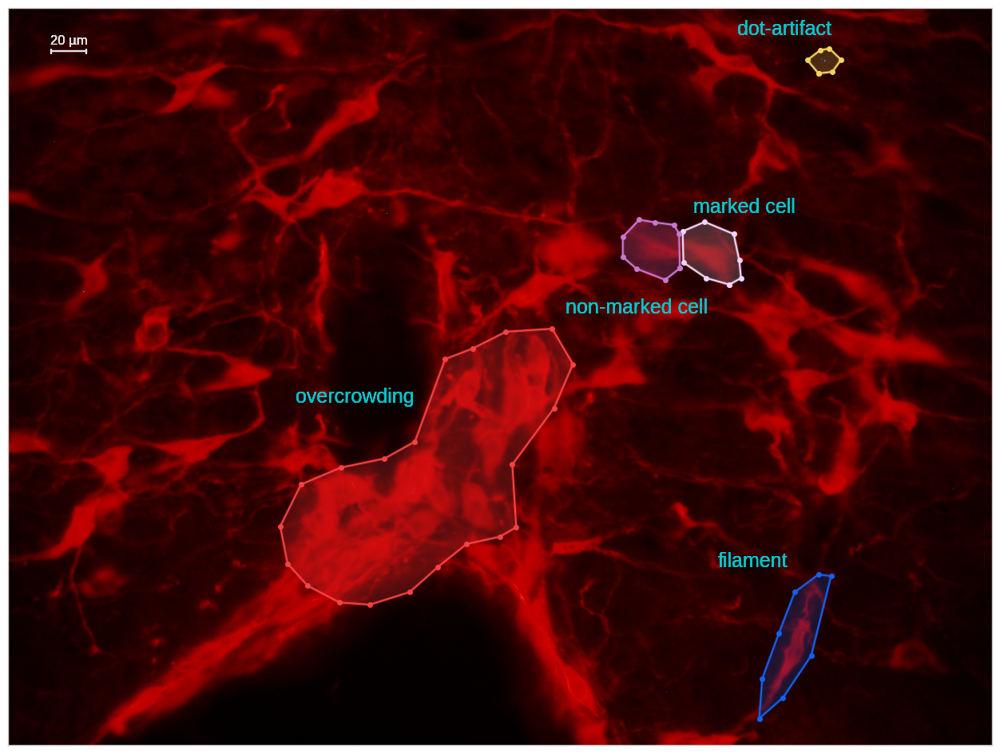

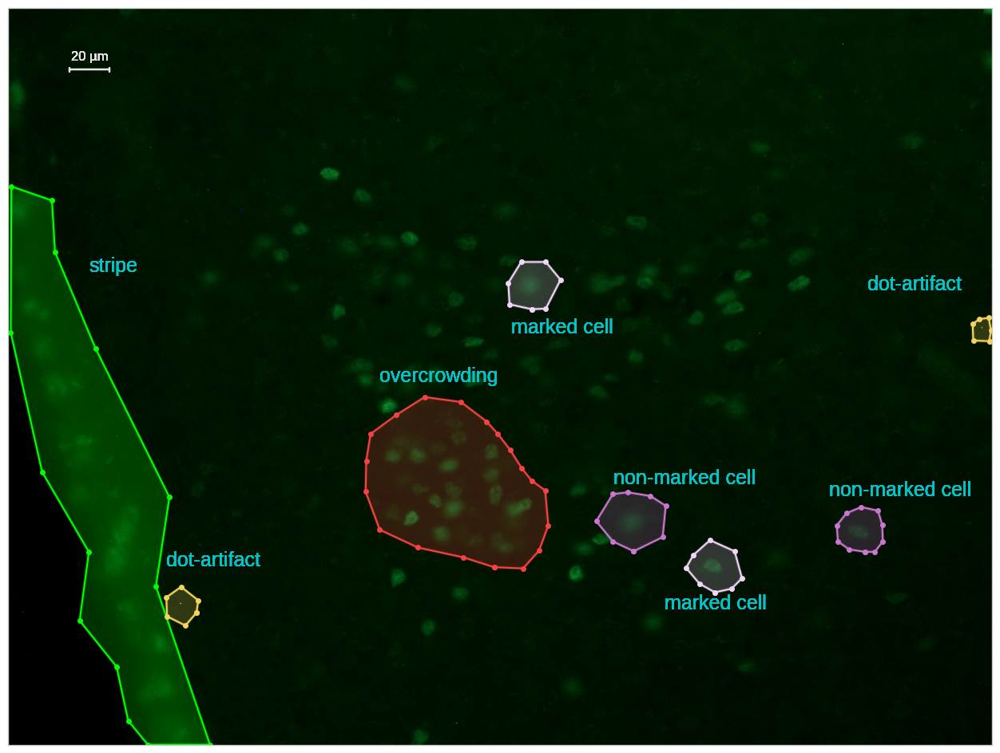

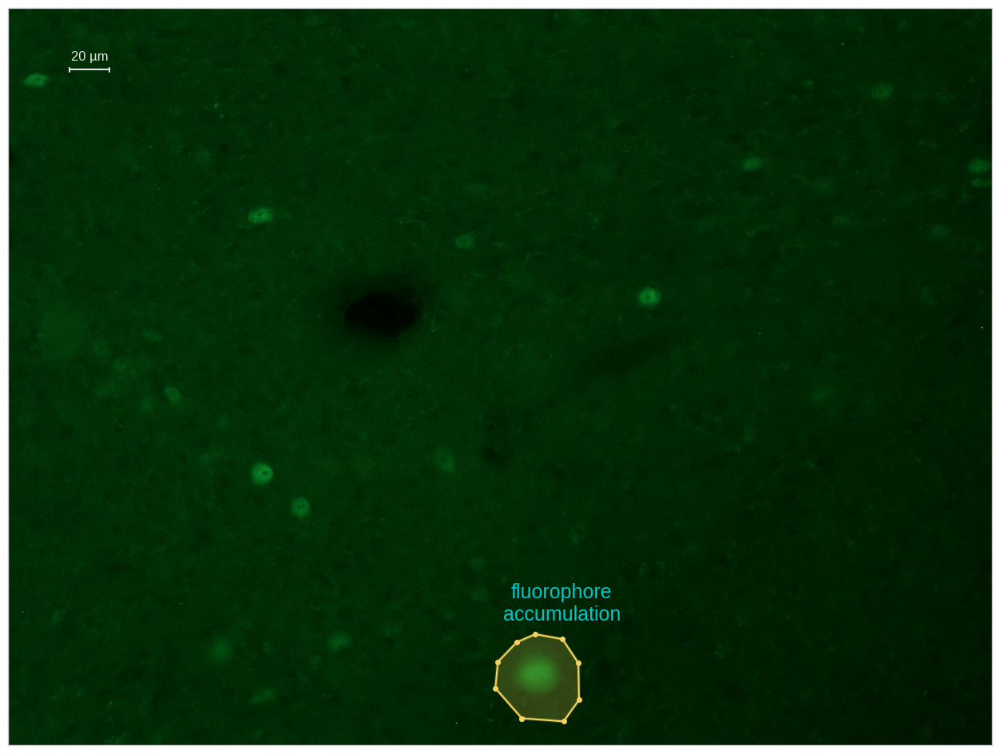

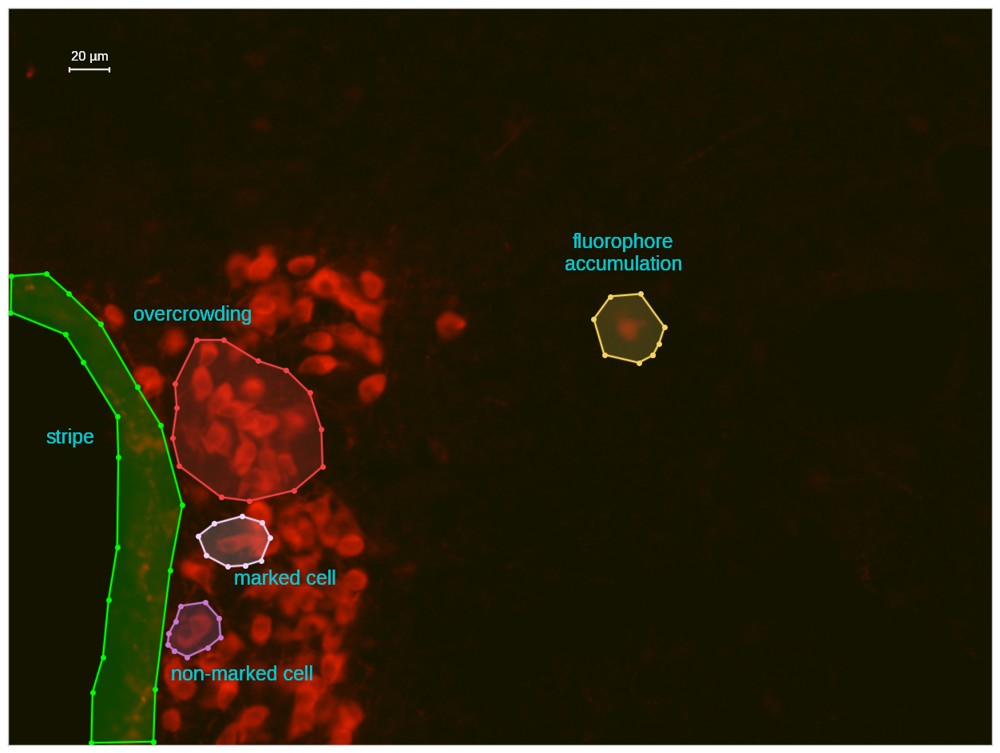

In [30]:
from matplotlib.patches import Polygon


def get_y_coords(y, img_height, label):
    y = np.array(y)

    if "stripe" in label:
        return y.mean() + 30
    if "non-marked" in label:
        return y.max() + 40

    r = y.max() - y.min()
    if r > img_height / 3:  #200:
        return img_height / 12 * 7.3  #379# y.mean()
    else:
        return y.min()


MULTIPLE = 20


def get_unit_scale_line(resolution, multiple):
    L = np.ceil(resolution * multiple)

    x_hook, y_hook = 100, 100
    y_bar_midlength = L / 20

    x = [
        x_hook, x_hook + L, None, x_hook, x_hook, None, x_hook + L, x_hook + L
    ]
    y = [
        y_hook, y_hook, None, y_hook - y_bar_midlength,
        y_hook + y_bar_midlength, None, y_hook - y_bar_midlength,
        y_hook + y_bar_midlength
    ]
    x_center, y_center = x_hook + int(L / 2), y_hook

    return x, y, x_center, y_center


transparency = 0.2
unit_scale_color = '#EEF0F2'  # cultured
unit_scale_color = '#FBFBFF'  # ghost white
unit_scale_color = '#E5E5E5'  # platinum
y_offset = 30

for image_name in challenges_df.filename.unique():
    resolution = 3.991 if image_name == "311.png" else 3.187
    unit_scale_x, unit_scale_y, unit_scale_xcenter, unit_scale_ycenter = get_unit_scale_line(
        resolution, MULTIPLE)

    image = io.imread(CHALLENGES_PATH / image_name)
    img_height, img_width, _ = image.shape

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(16, 12))

    # Display the image
    _ = ax.imshow(image, origin='upper')

    annotations = challenges_df.query(
        "filename==@image_name")["region_shape_attributes"]
    challenge_types = challenges_df.query(
        "filename==@image_name")["region_attributes"]

    for i, annotation_tuple in enumerate(zip(annotations, challenge_types)):
        annotation, challenge_type = annotation_tuple
        label = challenge_type["challenge"]
        c = palette_dict[label]  # deal with dotted VS shaded examples

        coordinates = _convert_from_VIA_polygon(annotation["all_points_x"],
                                                annotation["all_points_y"])
        x, y = zip(*coordinates)
        x = list(x)
        x.append(x[0])
        y = list(y)
        y.append(y[0])
        polygon = Polygon(
            coordinates,
            linewidth=3,
            edgecolor=c,
            facecolor=c,
            alpha=transparency,
        )
        _ = ax.add_patch(polygon)

        # Add markers on polygon's coordinates
        _ = ax.plot(x, y, marker='o', color=c, markersize=4)

        # Add text
        text = text_annotations[image_name]
        text_labels = text["labels"]
        text_coordinates = text["coordinates"]
        for text_label, text_coords in zip(text_labels, text_coordinates):
            xanch = 'right' if text_label in ['filament', 'dot-artifact'
                                              ] else 'center'
            yanch = 'top' if 'non-marked' in text_label else 'center'
            _ = ax.text(text_coords[0],
                        text_coords[1],
                        text_label,
                        color=color_text[0],
                        fontsize=params['axes.labelsize'],
                        ha=xanch,
                        va=yanch)

        # Add unit scale
        _ = ax.plot(unit_scale_x,
                    unit_scale_y,
                    color=unit_scale_color,
                    markersize=1)
        _ = ax.text(unit_scale_xcenter,
                    unit_scale_ycenter - y_offset / 2,
                    f"{MULTIPLE} µm",
                    color=unit_scale_color,
                    fontsize=int(size * 2 / 3),
                    ha='center')

        # Remove the axis ticks
        _ = ax.set_xticks([])
        _ = ax.set_yticks([])

    _ = plt.savefig(CHALLENGES_PATH / f"{image_name.split('.')[0]}.pdf",
                    format='pdf',
                    bbox_inches='tight',
                    pad_inches=0)
    _ = plt.show()